#### Imports

In [7]:
from utils.datasettemporal_new_mod import TemporalDatasetNewMod, TestSubsetRegressionNewMod
from utils.config import PROJECT_ROOT
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import math

#### Dataset Loading

In [9]:
mld_res = 1
feature_res = 1/12
dataset = TemporalDatasetNewMod(mld_res=mld_res, feature_res=feature_res, analysis = True, filepath=Path(PROJECT_ROOT) / "data/WaterOnlyMonthly/WaterOnlyMonthlyExtendedSeasonality.nc", rim=3)
print(f"Dataset size: {len(dataset)}")
print(f"Dataset shape: {dataset[0][0].shape}, label shape: {dataset[0][1].shape}")

/mnt/c/Users/samue/SynologyDrive/OceanPropInfSatImg/src/utils/datasettemporal_new_mod.py:59: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  for key, _ in self.dataset.dims.items():
<frozen _collections_abc>:894: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.


(342, 1, 145, 205) (342, 1, 145, 205)
(342, 7, 145, 205)
145
205
12
Lat list: (135, 3)  Lon list: (195, 3)
Lat range: 145, Lon range: 205
12 17
range(3, 144, 12)
range(3, 204, 12)
(342, 9, 151, 211)
Dataset size: 69768
Dataset shape: torch.Size([9, 18, 18]), label shape: torch.Size([1])


#### Full original

In [10]:
annotation_map, feature_map = dataset.annotations_map, dataset.feature_map

print(annotation_map.shape, feature_map.shape)

annotation_map_to_plot = np.squeeze(annotation_map)

#unit = 12
unit = 16

fig, ax = plt.subplots(math.ceil(annotation_map.shape[0]/unit), unit, figsize=(math.ceil(annotation_map.shape[0]/unit) * 5, 5 * unit))
ax = np.atleast_2d(ax)


for month, image in enumerate(annotation_map_to_plot):
    im = ax[month//unit, month%unit].imshow(image, cmap='viridis', vmax=100, vmin=0, origin='lower')
    ax[month//unit, month%unit].set_title(f"Temporal Unit {month+1} Image Shape: {image.shape}")
    ax[month//unit, month%unit].axis('off')
    fig.colorbar(im, label='MLD (m)', ax=ax[month//unit, month%unit])

(342, 1, 151, 211) (342, 9, 151, 211)


#### By Pixel

In [11]:
lat_range = dataset.feature_map.shape[-2]
lon_range = dataset.feature_map.shape[-1]
# lat_range = range(0, lat_range-dataset.grid_size, dataset.grid_size)
# lon_range = range(0, lon_range-dataset.grid_size, dataset.grid_size)
temp_unit_range = [j for j in range(dataset.feature_map.shape[0]) if (j%12)+1 in dataset.relevant_months]

mld = np.zeros((len(temp_unit_range), lat_range, lon_range))
feature = np.zeros((len(temp_unit_range), lat_range, lon_range))
average_mld = np.zeros((len(temp_unit_range), lat_range, lon_range))
full_mld = np.zeros((len(temp_unit_range), lat_range, lon_range))

for i in range(len(dataset)):
    grid_coords, centre_coords, temp_unit = dataset.grid_and_centre_coords_and_temp_unit[i]
    temp_unit_indexed = temp_unit_range.index(temp_unit)
    image = dataset.feature_map[temp_unit, :, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size]
    label = dataset.annotations_map[temp_unit, :, centre_coords[0], centre_coords[1]]
    avg_label = dataset.annotations_map[temp_unit, :, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size].mean(axis=(1, 2))

    mld[temp_unit_indexed, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size] = label
    average_mld[temp_unit_indexed, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size] = avg_label

for i in range(len(temp_unit_range)):
    temp_unit = temp_unit_range[i]
    full_mld[i] = dataset.annotations_map[temp_unit, :, :, :]


In [12]:
mld.shape

(342, 151, 211)

### Full Analysis

In [16]:
dataset_indices = range(len(dataset))
test_dataset = TestSubsetRegressionNewMod(dataset, dataset_indices)
features_num = dataset.feature_map.shape[1]
# dataset.normalize=False
lat_range = dataset.feature_map.shape[-2]
lon_range = dataset.feature_map.shape[-1]
temp_unit_range = [j for j in range(dataset.feature_map.shape[0]) if (j%12)+1 in dataset.relevant_months]

mld_loaded = np.zeros((len(temp_unit_range), lat_range, lon_range))
feature_loaded = np.zeros((len(temp_unit_range), features_num, lat_range, lon_range))
feature_loaded_average = np.zeros((len(temp_unit_range), features_num, lat_range, lon_range))
for i, batch in enumerate(test_dataset):
    X, y, (grid_coords, centre_coords, temp_unit) = batch
    # if y.isnan():
    #     print(f"Skipping invalid label at index {i}: {y.item()}")
    #     if X.isnan().any():
    #         print(f"Skipping due to NaN in features at index {i}")
    #     continue
    mld_loaded[temp_unit, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size] = y.item()* (dataset.std_label) + dataset.mean_label
    feature_loaded[temp_unit, :, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size] = X* (dataset.std_label) + dataset.mean_label
    feature_loaded_average[temp_unit, :, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size] = X.mean(axis=(1, 2))[:, np.newaxis, np.newaxis]* (dataset.std_label) + dataset.mean_label


/tmp/ipykernel_1871072/890103469.py:19: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  mld_loaded[temp_unit, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size] = y.item()* (dataset.std_label) + dataset.mean_label
/tmp/ipykernel_1871072/890103469.py:20: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  feature_loaded[temp_unit, :, grid_coords[0]:grid_coords[0]+dataset.grid_size, grid_coords[1]:grid_coords[1]+dataset.grid_size] = X* (

ValueError: could not broadcast input array from shape (9,18,18) into shape (9,12,12)

In [14]:
dataset.grid_size

12

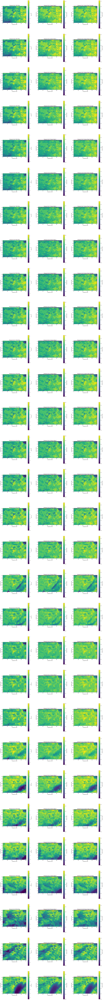

In [13]:
fig, ax = plt.subplots(nrows=len(temp_unit_range), ncols=3, figsize=(9*(3), 9 * len(temp_unit_range)))
for i, t in enumerate(temp_unit_range):
    ax[i, 0].imshow(mld_loaded[i], origin='lower', cmap='viridis')
    ax[i, 0].set_title(f'Temporal Unit {t+1} MLD Map')
    ax[i, 0].set_xlabel('Longitude Index')
    ax[i, 0].set_ylabel('Latitude Index')
    fig.colorbar(ax[i, 0].images[0], label='MLD (m)', ax=ax[i, 0])
    ax[i, 1].imshow(feature_loaded[i, -3], origin='lower', cmap='viridis')
    ax[i, 1].set_title(f'Temporal Unit {t+1} Feature Map {features_num}')
    ax[i, 1].set_xlabel('Longitude Index')
    ax[i, 1].set_ylabel('Latitude Index')
    fig.colorbar(ax[i, 1].images[0], label='Feature Value', ax=ax[i, 1])
    ax[i, 2].imshow(feature_loaded_average[i, -3], origin='lower', cmap='viridis')
    ax[i, 2].set_title(f'Temporal Unit {t+1} Feature Map {features_num} Average')
    ax[i, 2].set_xlabel('Longitude Index')
    ax[i, 2].set_ylabel('Latitude Index')
    fig.colorbar(ax[i, 2].images[0], label='Feature Value', ax=ax[i, 2])

### Plotting

In [ ]:
fig, ax = plt.subplots(nrows=len(temp_unit_range), ncols=1+features_num, figsize=(9*(1+features_num), 9 * len(temp_unit_range)))
for i, t in enumerate([temp_unit_range[0]]):
    ax[i, 0].imshow(mld_loaded[i], origin='lower', cmap='viridis')
    ax[i, 0].set_title(f'Temporal Unit {t+1} MLD Map')
    ax[i, 0].set_xlabel('Longitude Index')
    ax[i, 0].set_ylabel('Latitude Index')
    fig.colorbar(ax[i, 0].images[0], label='MLD (m)', ax=ax[i, 0])
    for j in range(features_num):
        feature = feature_loaded[i, j]
        ax[i, j+1].imshow(feature, origin='lower', cmap='viridis')
        ax[i, j+1].set_title(f'Temporal Unit {t+1} Feature Map {j+1}')
        ax[i, j+1].set_xlabel('Longitude Index')
        ax[i, j+1].set_ylabel('Latitude Index')
        fig.colorbar(ax[i, j+1].images[0], label='Feature Value', ax=ax[i, j+1])

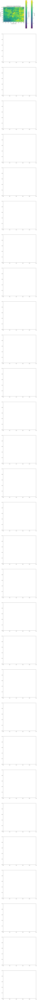

In [4]:
fig, ax = plt.subplots(nrows=len(temp_unit_range), figsize=(9, 9 * len(temp_unit_range)))
for i, t in enumerate([temp_unit_range[0]]):
    ax[i].imshow(mld_loaded[i], origin='lower', cmap='viridis')
    ax[i].set_title(f'Temporal Unit {t+1} MLD Map')
    ax[i].set_xlabel('Longitude Index')
    ax[i].set_ylabel('Latitude Index')
    fig.colorbar(ax[i].images[0], label='MLD (m)', ax=ax[i])
    ax[i].imshow(feature_loaded[i, -3], origin='lower', cmap='viridis', alpha=0.5)
    ax[i].set_title(f'Temporal Unit {t+1} Original MLD Map {features_num}')
    ax[i].set_xlabel('Longitude Index')
    ax[i].set_ylabel('Latitude Index')
    fig.colorbar(ax[i].images[0], label='Original MLD (m)', ax=ax[i])

### Rest

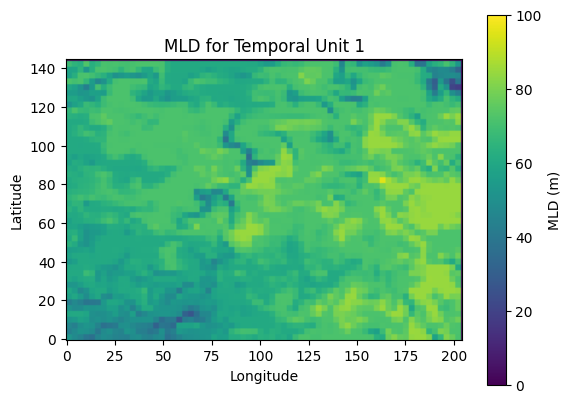

In [40]:
plt.imshow(mld[3, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
plt.title("MLD for Temporal Unit 1")
plt.colorbar(label='MLD (m)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")

# grid_size = dataset.grid_size  # Change this value to adjust grid size
# y_max, x_max = mld[3, :, :].shape

# for x in range(0, x_max, grid_size):
#     plt.axvline(x, color='red', alpha=0.5, linestyle='-', lw=1)
    
# for y in range(0, y_max, grid_size):
#     plt.axhline(y, color='red', alpha=0.5, linestyle='-', lw=1)

plt.show()

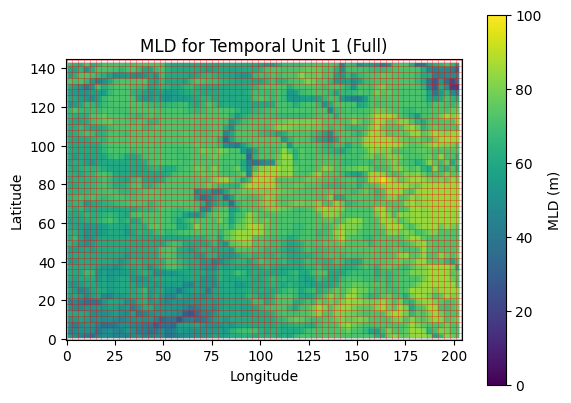

In [41]:
plt.imshow(full_mld[3, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
plt.title("MLD for Temporal Unit 1 (Full)")
plt.colorbar(label='MLD (m)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
# Add custom grid overlay
grid_size = dataset.grid_size  # Change this value to adjust grid size
y_max, x_max = mld[3, :, :].shape

# Draw vertical grid lines
for x in range(0, x_max, grid_size):
    plt.axvline(x, color='red', alpha=0.5, linestyle='-', lw=0.5)

# Draw horizontal grid lines
for y in range(0, y_max, grid_size):
    plt.axhline(y, color='red', alpha=0.5, linestyle='-', lw=0.5)

plt.show()

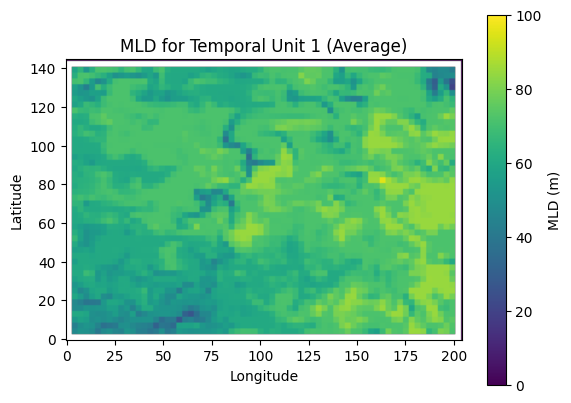

In [42]:
plt.imshow(average_mld[3, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
plt.title("MLD for Temporal Unit 1 (Average)")
plt.colorbar(label='MLD (m)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
# # Add custom grid overlay
# grid_size = dataset.grid_size  # Change this value to adjust grid size
# y_max, x_max = mld[3, :, :].shape

# # Draw vertical grid lines
# for x in range(0, x_max, grid_size):
#     plt.axvline(x, color='red', alpha=0.5, linestyle='-', lw=1)

# # Draw horizontal grid lines
# for y in range(0, y_max, grid_size):
#     plt.axhline(y, color='red', alpha=0.5, linestyle='-', lw=1)

plt.show()

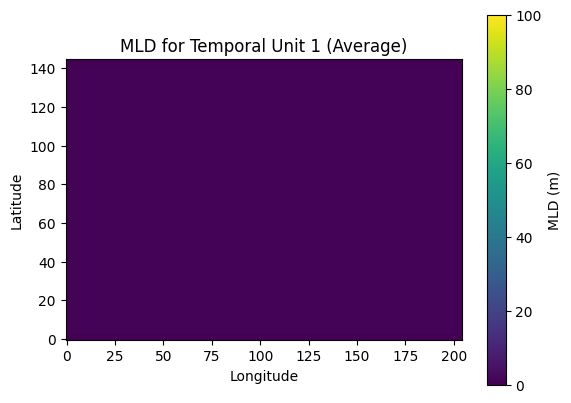

In [43]:
compare = average_mld == mld
plt.imshow(compare[1, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
plt.title("MLD for Temporal Unit 1 (Average)")
plt.colorbar(label='MLD (m)')
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()

In [44]:
# Check if all values in compare are True
all_true = compare.all()
print(f"All values in compare are True: {all_true}")

# Check for each temporal unit
for i in range(compare.shape[0]):
    all_true_unit = compare[i].all()
    print(f"All values in temporal unit {i+1} are True: {all_true_unit}")
    if not all_true_unit:
        # Calculate the percentage of True values for this temporal unit
        percent_true = compare[i].sum() / compare[i].size * 100
        print(f"  Percentage of True values in temporal unit {i+1}: {percent_true:.2f}%")

# Calculate the overall percentage of True values
overall_percent_true = compare.sum() / compare.size * 100
print(f"Overall percentage of True values: {overall_percent_true:.2f}%")

All values in compare are True: False
All values in temporal unit 1 are True: False
  Percentage of True values in temporal unit 1: 93.10%
All values in temporal unit 2 are True: False
  Percentage of True values in temporal unit 2: 93.10%
All values in temporal unit 3 are True: False
  Percentage of True values in temporal unit 3: 93.10%
All values in temporal unit 4 are True: False
  Percentage of True values in temporal unit 4: 93.10%
All values in temporal unit 5 are True: False
  Percentage of True values in temporal unit 5: 93.10%
All values in temporal unit 6 are True: False
  Percentage of True values in temporal unit 6: 93.10%
All values in temporal unit 7 are True: False
  Percentage of True values in temporal unit 7: 93.10%
All values in temporal unit 8 are True: False
  Percentage of True values in temporal unit 8: 93.10%
All values in temporal unit 9 are True: False
  Percentage of True values in temporal unit 9: 93.10%
All values in temporal unit 10 are True: False
  Perc

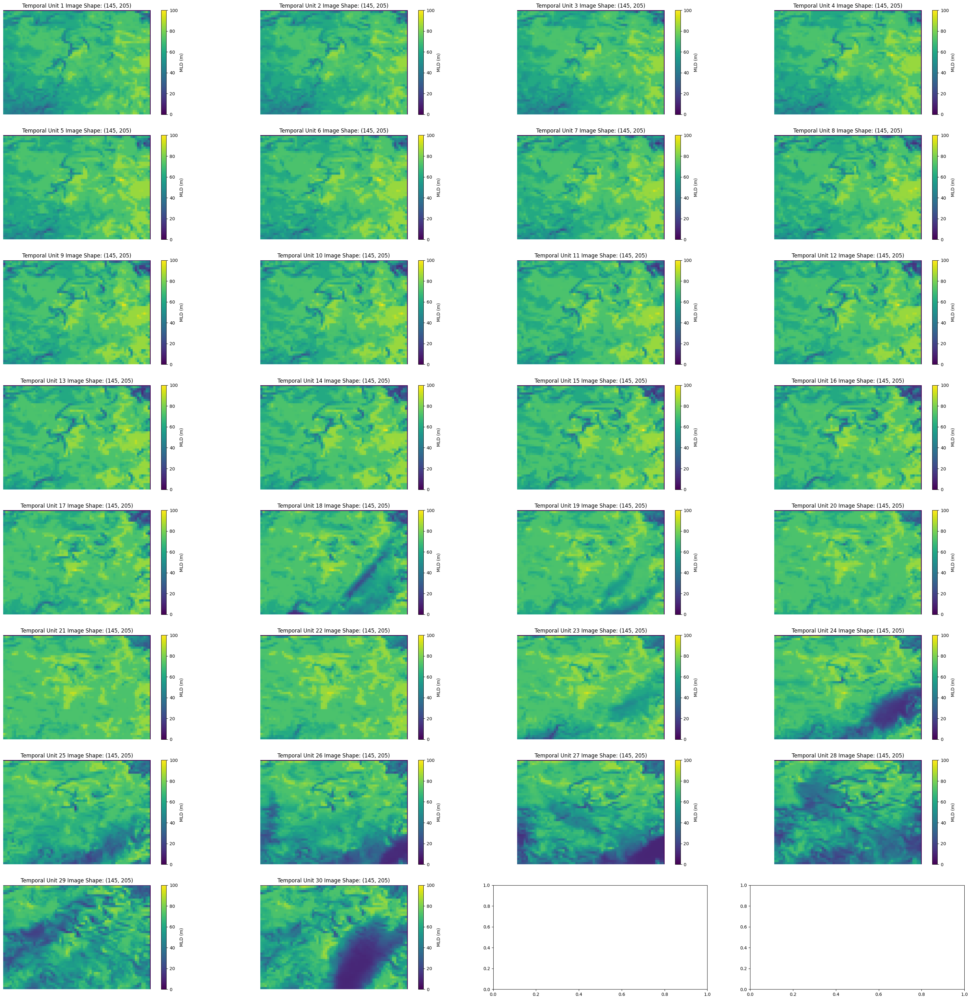

In [45]:
unit = 4

fig, ax = plt.subplots(math.ceil(mld.shape[0]/unit), unit, figsize=(math.ceil(mld.shape[0]/unit) * 5, 10 * unit))
ax = np.atleast_2d(ax)
for i in range(mld.shape[0]):
    im = ax[i//unit, i%unit].imshow(mld[i, :, :], cmap='viridis', vmax=100, vmin=0, origin='lower')
    ax[i//unit, i%unit].set_title(f"Temporal Unit {i+1} Image Shape: {mld[i, :, :].shape}")
    ax[i//unit, i%unit].axis('off')
    fig.colorbar(im, label='MLD (m)', ax=ax[i//unit, i%unit])